In [119]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


In [120]:
dataset=pd.read_excel("/Users/aayushjain/codes/project/stellar Analytics/astrotrain.xlsx")

In [121]:
dataset.head()

,SUBSURVEY,SNID,IAUC,FAKE,RA,DECL,PIXSIZE,NXPIX,NYPIX,CCDNUM,...,SIM_PEAKMAG_z,SIM_EXPOSURE_g,SIM_EXPOSURE_r,SIM_EXPOSURE_i,SIM_EXPOSURE_z,SIM_GALFRAC_g,SIM_GALFRAC_r,SIM_GALFRAC_i,SIM_GALFRAC_z,SIM_SUBSAMPLE_INDEX
0,,10473255,NULL,2,53.468451,-28.349424,0.27,-9,-9,44,...,23.664705,1,1,1,1,2.378913e+00,1.384469,1.228777,1.400711,-9
1,,2110040,NULL,2,53.508185,-28.470810,0.27,-9,-9,50,...,24.363064,1,1,1,1,3.254097e-14,7.968017,3.885829,3.697690,-9
2,,9966178,NULL,2,35.077432,-6.979272,0.27,-9,-9,51,...,23.319248,1,1,1,1,5.848331e-01,0.558739,0.499326,0.525232,-9
3,,19732134,NULL,2,52.852204,-27.184372,0.27,-9,-9,3,...,22.917084,1,1,1,1,4.299130e+00,13.111013,19.559818,34.610160,-9
4,,1582526,NULL,2,36.932302,-5.248342,0.27,-9,-9,55,...,22.626780,1,1,1,1,2.718171e-01,0.285706,0.416343,0.543132,-9


In [122]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40000 entries, 0 to 39999
Data columns (total 82 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   SUBSURVEY             40000 non-null  object 
 1   SNID                  40000 non-null  int64  
 2   IAUC                  40000 non-null  object 
 3   FAKE                  40000 non-null  int64  
 4   RA                    40000 non-null  float64
 5   DECL                  40000 non-null  float64
 6   PIXSIZE               40000 non-null  float64
 7   NXPIX                 40000 non-null  int64  
 8   NYPIX                 40000 non-null  int64  
 9   CCDNUM                40000 non-null  int64  
 10  SNTYPE                40000 non-null  int64  
 11  NOBS                  40000 non-null  int64  
 12  PTROBS_MIN            40000 non-null  int64  
 13  PTROBS_MAX            40000 non-null  int64  
 14  MWEBV                 40000 non-null  float64
 15  MWEBV_ERR          

In [123]:
def unique_nunique_summary(dataset):
    #unique_values = dataset.apply(lambda x: x.unique())
    nunique_values = dataset.apply(lambda x: x.nunique())

    summary = pd.DataFrame({
        'Column': dataset.columns,
        #Unique Values': unique_values,
        'Nunique Values': nunique_values
    })

    return summary

# Example usage:
# Assuming 'your_dataset' is the name of your DataFrame
result_summary = unique_nunique_summary(dataset)
print(result_summary)


                                    Column  Nunique Values
SUBSURVEY                        SUBSURVEY               3
SNID                                  SNID           40000
IAUC                                  IAUC               1
FAKE                                  FAKE               1
RA                                      RA            7075
DECL                                  DECL            7075
PIXSIZE                            PIXSIZE               1
NXPIX                                NXPIX               1
NYPIX                                NYPIX               1
CCDNUM                              CCDNUM              59
SNTYPE                              SNTYPE               7
NOBS                                  NOBS             197
PTROBS_MIN                      PTROBS_MIN           39737
PTROBS_MAX                      PTROBS_MAX           39723
MWEBV                                MWEBV            7073
MWEBV_ERR                        MWEBV_ERR            70

In [124]:
pd.set_option('display.max_rows', None)


In [125]:
# Assuming your original DataFrame is named 'df'
numeric_df = dataset.select_dtypes(include=['int64', 'float64'])
print(numeric_df.head())
print(numeric_df.info())



       SNID  FAKE         RA       DECL  PIXSIZE  NXPIX  NYPIX  CCDNUM  \
0  10473255     2  53.468451 -28.349424     0.27     -9     -9      44   
1   2110040     2  53.508185 -28.470810     0.27     -9     -9      50   
2   9966178     2  35.077432  -6.979272     0.27     -9     -9      51   
3  19732134     2  52.852204 -27.184372     0.27     -9     -9       3   
4   1582526     2  36.932302  -5.248342     0.27     -9     -9      55   

   SNTYPE  NOBS  ...  SIM_PEAKMAG_z  SIM_EXPOSURE_g  SIM_EXPOSURE_r  \
0     133    61  ...      23.664705               1               1   
1     101    69  ...      24.363064               1               1   
2     122    65  ...      23.319248               1               1   
3     120    34  ...      22.917084               1               1   
4     101    65  ...      22.626780               1               1   

   SIM_EXPOSURE_i  SIM_EXPOSURE_z  SIM_GALFRAC_g  SIM_GALFRAC_r  \
0               1               1   2.378913e+00       1.3844

In [126]:
for column in numeric_df.columns:
    print(f"Summary for column: {column}")
    print(numeric_df[column].describe())
    print("\n")


Summary for column: SNID
count    4.000000e+04
mean     1.676771e+07
std      9.683794e+06
min      2.354000e+03
25%      8.367022e+06
50%      1.686448e+07
75%      2.510454e+07
max      3.359532e+07
Name: SNID, dtype: float64


Summary for column: FAKE
count    40000.0
mean         2.0
std          0.0
min          2.0
25%          2.0
50%          2.0
75%          2.0
max          2.0
Name: FAKE, dtype: float64


Summary for column: RA
count    40000.000000
mean        39.835341
std         14.800212
min          6.392980
25%         35.716156
50%         41.157764
75%         52.866702
max         55.512060
Name: RA, dtype: float64


Summary for column: DECL
count    40000.000000
mean       -19.407487
std         15.051050
min        -44.976723
25%        -28.640380
50%        -27.204088
75%         -4.633564
max          0.978050
Name: DECL, dtype: float64


Summary for column: PIXSIZE
count    40000.00
mean         0.27
std          0.00
min          0.27
25%          0.27
50%   

In [127]:
numeric_df = numeric_df.loc[:, numeric_df.std() != 0]


In [128]:
correlation_matrix = numeric_df.corr()

# Plot the correlation matrix as a heatmap
plt.figure(figsize=(120, 80))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix Heatmap')
plt.show()


In [129]:
numeric_df.isnull().sum()

SNID                        0
RA                          0
DECL                        0
CCDNUM                      0
SNTYPE                      0
NOBS                        0
PTROBS_MIN                  0
PTROBS_MAX                  0
MWEBV                       0
MWEBV_ERR                   0
REDSHIFT_HELIO              0
REDSHIFT_HELIO_ERR          0
REDSHIFT_FINAL              0
REDSHIFT_FINAL_ERR          0
HOSTGAL_OBJID               0
HOSTGAL_PHOTOZ              0
HOSTGAL_PHOTOZ_ERR          0
HOSTGAL_SPECZ               0
HOSTGAL_SPECZ_ERR           0
HOSTGAL_SNSEP               0
HOSTGAL_MAG_g               0
HOSTGAL_MAG_r               0
HOSTGAL_MAG_i               0
HOSTGAL_MAG_z               0
HOSTGAL_SB_FLUXCAL_g        0
HOSTGAL_SB_FLUXCAL_r        0
HOSTGAL_SB_FLUXCAL_i        0
HOSTGAL_SB_FLUXCAL_z        0
PEAKMJD                     0
SIM_MODEL_INDEX             0
SIM_TYPE_INDEX              0
SIM_NON1a                   0
SIM_LIBID                   0
SIM_SEARCH

In [130]:
import pandas as pd
from scipy.stats import iqr, skew

# Assuming numeric_df is your DataFrame
# Calculate IQR for each column
iqr_values = numeric_df.apply(iqr)

# Calculate skewness for each column
skewness_values = numeric_df.apply(skew)

# Print the results
print("Interquartile Range (IQR) for each column:")
print(iqr_values)

print("\nSkewness for each column:")
print(skewness_values)


Interquartile Range (IQR) for each column:
SNID                    1.673752e+07
RA                      1.715055e+01
DECL                    2.400682e+01
CCDNUM                  3.100000e+01
SNTYPE                  2.100000e+01
NOBS                    3.100000e+01
PTROBS_MIN              7.178802e+05
PTROBS_MAX              7.178595e+05
MWEBV                   1.828912e-02
MWEBV_ERR               3.048187e-03
REDSHIFT_HELIO          3.611473e-01
REDSHIFT_HELIO_ERR      3.509000e-02
REDSHIFT_FINAL          3.611460e-01
REDSHIFT_FINAL_ERR      3.509000e-02
HOSTGAL_OBJID           1.499361e+07
HOSTGAL_PHOTOZ          3.584324e-01
HOSTGAL_PHOTOZ_ERR      3.088000e-02
HOSTGAL_SPECZ           9.535610e+00
HOSTGAL_SPECZ_ERR       9.000500e+00
HOSTGAL_SNSEP           6.547391e-01
HOSTGAL_MAG_g           1.704993e+00
HOSTGAL_MAG_r           1.948333e+00
HOSTGAL_MAG_i           1.906345e+00
HOSTGAL_MAG_z           1.979328e+00
HOSTGAL_SB_FLUXCAL_g    1.260359e+01
HOSTGAL_SB_FLUXCAL_r    3.732571

In [131]:
#corr b/w sim type index andn simnona1a

In [132]:
numeric_df.head()

,SNID,RA,DECL,CCDNUM,SNTYPE,NOBS,PTROBS_MIN,PTROBS_MAX,MWEBV,MWEBV_ERR,...,SIM_SALT2alpha,SIM_SALT2beta,SIM_PEAKMAG_g,SIM_PEAKMAG_r,SIM_PEAKMAG_i,SIM_PEAKMAG_z,SIM_GALFRAC_g,SIM_GALFRAC_r,SIM_GALFRAC_i,SIM_GALFRAC_z
0,10473255,53.468451,-28.349424,44,133,61,1418390,1418450,0.009902,0.001650,...,NaN,NaN,25.321142,24.047743,23.709719,23.664705,2.378913e+00,1.384469,1.228777,1.400711
1,2110040,53.508185,-28.470810,50,101,69,713393,713461,0.006961,0.001160,...,0.144,3.1,-9.000000,26.370707,24.971678,24.363064,3.254097e-14,7.968017,3.885829,3.697690
2,9966178,35.077432,-6.979272,51,122,65,802497,802561,0.024851,0.004142,...,NaN,NaN,24.916900,23.966694,23.518854,23.319248,5.848331e-01,0.558739,0.499326,0.525232
3,19732134,52.852204,-27.184372,3,120,34,111780,111813,0.008636,0.001439,...,NaN,NaN,22.514202,22.668192,22.609093,22.917084,4.299130e+00,13.111013,19.559818,34.610160
4,1582526,36.932302,-5.248342,55,101,65,230732,230796,0.025626,0.004271,...,0.144,3.1,23.247778,22.357126,22.506872,22.626780,2.718171e-01,0.285706,0.416343,0.543132


In [133]:
import pandas as pd


flux_columns = ['HOSTGAL_SB_FLUXCAL_g', 'HOSTGAL_SB_FLUXCAL_r', 'HOSTGAL_SB_FLUXCAL_i', 'HOSTGAL_SB_FLUXCAL_z']

numeric_df['Flux'] = numeric_df[flux_columns].mean(axis=1) ** 2

print(numeric_df)


           SNID         RA       DECL  CCDNUM  SNTYPE  NOBS  PTROBS_MIN  \
0      10473255  53.468451 -28.349424      44     133    61     1418390   
1       2110040  53.508185 -28.470810      50     101    69      713393   
2       9966178  35.077432  -6.979272      51     122    65      802497   
3      19732134  52.852204 -27.184372       3     120    34      111780   
4       1582526  36.932302  -5.248342      55     101    65      230732   
5      15277274   7.913691 -43.078257      35     101    15      785230   
6      31104844  35.762009  -4.674701      33     121    53      588962   
7      25207920  35.559682  -4.134531      13     121    64      634260   
8       8528690  53.712019 -28.986642      26     101    75      891337   
9      20161874  52.961251 -28.116795      36     132    69     1387371   
10     25257705  53.256660 -28.981820      25     101    52      678522   
11     23547869  34.467010  -5.237452      41     120    77      230561   
12     26462909  52.84496

In [134]:
numeric_df.head()

,SNID,RA,DECL,CCDNUM,SNTYPE,NOBS,PTROBS_MIN,PTROBS_MAX,MWEBV,MWEBV_ERR,...,SIM_SALT2beta,SIM_PEAKMAG_g,SIM_PEAKMAG_r,SIM_PEAKMAG_i,SIM_PEAKMAG_z,SIM_GALFRAC_g,SIM_GALFRAC_r,SIM_GALFRAC_i,SIM_GALFRAC_z,Flux
0,10473255,53.468451,-28.349424,44,133,61,1418390,1418450,0.009902,0.001650,...,NaN,25.321142,24.047743,23.709719,23.664705,2.378913e+00,1.384469,1.228777,1.400711,144.926542
1,2110040,53.508185,-28.470810,50,101,69,713393,713461,0.006961,0.001160,...,3.1,-9.000000,26.370707,24.971678,24.363064,3.254097e-14,7.968017,3.885829,3.697690,160.901293
2,9966178,35.077432,-6.979272,51,122,65,802497,802561,0.024851,0.004142,...,NaN,24.916900,23.966694,23.518854,23.319248,5.848331e-01,0.558739,0.499326,0.525232,23.342709
3,19732134,52.852204,-27.184372,3,120,34,111780,111813,0.008636,0.001439,...,NaN,22.514202,22.668192,22.609093,22.917084,4.299130e+00,13.111013,19.559818,34.610160,330235.580985
4,1582526,36.932302,-5.248342,55,101,65,230732,230796,0.025626,0.004271,...,3.1,23.247778,22.357126,22.506872,22.626780,2.718171e-01,0.285706,0.416343,0.543132,124.158978


In [135]:
columns_of_interest = ['SIM_NON1a', 'SIM_MODEL_INDEX']

subset_df = numeric_df[columns_of_interest]

correlation_matrix = subset_df.corr()

print(correlation_matrix)

                 SIM_NON1a  SIM_MODEL_INDEX
SIM_NON1a         1.000000         0.800551
SIM_MODEL_INDEX   0.800551         1.000000


In [136]:
dataset['RA_rad'] = np.radians(dataset['RA'])
dataset['DECL_rad'] = np.radians(dataset['DECL'])

dataset['x'] = np.cos(dataset['DECL_rad']) * np.cos(dataset['RA_rad'])
dataset['y'] = np.cos(dataset['DECL_rad']) * np.sin(dataset['RA_rad'])
dataset['z'] = np.sin(dataset['DECL_rad'])


In [137]:
dataset['FLUX']=numeric_df['Flux']

In [138]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40000 entries, 0 to 39999
Data columns (total 88 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   SUBSURVEY             40000 non-null  object 
 1   SNID                  40000 non-null  int64  
 2   IAUC                  40000 non-null  object 
 3   FAKE                  40000 non-null  int64  
 4   RA                    40000 non-null  float64
 5   DECL                  40000 non-null  float64
 6   PIXSIZE               40000 non-null  float64
 7   NXPIX                 40000 non-null  int64  
 8   NYPIX                 40000 non-null  int64  
 9   CCDNUM                40000 non-null  int64  
 10  SNTYPE                40000 non-null  int64  
 11  NOBS                  40000 non-null  int64  
 12  PTROBS_MIN            40000 non-null  int64  
 13  PTROBS_MAX            40000 non-null  int64  
 14  MWEBV                 40000 non-null  float64
 15  MWEBV_ERR          

In [139]:
filtered_df= dataset[dataset['SIM_TYPE_NAME']!='UNKNOWN ']

In [140]:
filtered_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 21749 entries, 0 to 39999
Data columns (total 88 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   SUBSURVEY             21749 non-null  object 
 1   SNID                  21749 non-null  int64  
 2   IAUC                  21749 non-null  object 
 3   FAKE                  21749 non-null  int64  
 4   RA                    21749 non-null  float64
 5   DECL                  21749 non-null  float64
 6   PIXSIZE               21749 non-null  float64
 7   NXPIX                 21749 non-null  int64  
 8   NYPIX                 21749 non-null  int64  
 9   CCDNUM                21749 non-null  int64  
 10  SNTYPE                21749 non-null  int64  
 11  NOBS                  21749 non-null  int64  
 12  PTROBS_MIN            21749 non-null  int64  
 13  PTROBS_MAX            21749 non-null  int64  
 14  MWEBV                 21749 non-null  float64
 15  MWEBV_ERR             21

In [141]:
numeric_df_filtered = filtered_df.select_dtypes(include=['int64', 'float64'])
numeric_df_filtered = numeric_df_filtered.loc[:, numeric_df_filtered.std() != 0]
correlation_matrix = numeric_df_filtered.corr()
numeric_df_filtered = numeric_df_filtered.dropna(axis=1, how='all')

plt.figure(figsize=(120, 80))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix Heatmap')
plt.show()


In [142]:
filtered_df['MeanSquare_MAG'] = filtered_df[['HOSTGAL_MAG_g', 'HOSTGAL_MAG_r', 'HOSTGAL_MAG_i', 'HOSTGAL_MAG_z']].mean(axis=1) ** 2
filtered_df['MeanSquare_PEAKMAG'] = filtered_df[['SIM_PEAKMAG_g', 'SIM_PEAKMAG_r', 'SIM_PEAKMAG_i', 'SIM_PEAKMAG_z']].mean(axis=1) ** 2
filtered_df['MeanSquare_GALFRAC'] = filtered_df[['SIM_GALFRAC_g', 'SIM_GALFRAC_r', 'SIM_GALFRAC_i', 'SIM_GALFRAC_z']].mean(axis=1) ** 2


/var/folders/q_/dn720rf91691y39h0s_hr_280000gn/T/ipykernel_9780/4063285778.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['MeanSquare_MAG'] = filtered_df[['HOSTGAL_MAG_g', 'HOSTGAL_MAG_r', 'HOSTGAL_MAG_i', 'HOSTGAL_MAG_z']].mean(axis=1) ** 2
/var/folders/q_/dn720rf91691y39h0s_hr_280000gn/T/ipykernel_9780/4063285778.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['MeanSquare_PEAKMAG'] = filtered_df[['SIM_PEAKMAG_g', 'SIM_PEAKMAG_r', 'SIM_PEAKMAG_i', 'SIM_PEAKMAG_z']].mean(axi

In [143]:
filtered_df['AVG_PTROBS']=filtered_df[['PTROBS_MIN','PTROBS_MAX']].mean(axis=1)

/var/folders/q_/dn720rf91691y39h0s_hr_280000gn/T/ipykernel_9780/3927911638.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['AVG_PTROBS']=filtered_df[['PTROBS_MIN','PTROBS_MAX']].mean(axis=1)


In [144]:
copy_of_filtered_data=filtered_df

In [145]:
columns_to_drop = ['SUBSURVEY', 'SNID', 'IAUC', 'FAKE', 'RA', 'DECL', 'PIXSIZE', 'NXPIX', 'NYPIX', 'CCDNUM', 'PTROBS_MIN',
                   'PTROBS_MAX', 'MWEBV_ERR', 'REDSHIFT_HELIO_ERR', 'REDSHIFT_FINAL', 'REDSHIFT_FINAL_ERR', 'VPEC',
                   'VPEC_ERR', 'HOSTGAL_OBJID', 'HOSTGAL_PHOTOZ_ERR', 'HOSTGAL_LOGMASS', 'HOSTGAL_LOGMASS_ERR',
                   'HOSTGAL_MAG_g', 'HOSTGAL_MAG_r', 'HOSTGAL_MAG_i', 'HOSTGAL_MAG_z', 'HOSTGAL_SB_FLUXCAL_g',
                   'HOSTGAL_SB_FLUXCAL_r', 'HOSTGAL_SB_FLUXCAL_i', 'HOSTGAL_SB_FLUXCAL_z', 'PEAKMJD', 'SEARCH_TYPE',
                   'SIM_MODEL_NAME', 'SIM_MODEL_INDEX', 'SIM_NGEN_LIBID', 'SIM_NOBS_UNDEFINED', 'SIM_VPEC',
                   'SIM_LENSDMU', 'SIM_RA', 'SIM_DECL', 'SIM_AV', 'SIM_RV', 'SIM_SALT2x0', 'SIM_SALT2x1', 'SIM_SALT2c',
                   'SIM_SALT2mB', 'SIM_SALT2alpha', 'SIM_SALT2beta', 'SIM_PEAKMAG_g', 'SIM_PEAKMAG_r', 'SIM_PEAKMAG_i',
                   'SIM_PEAKMAG_z', 'SIM_EXPOSURE_g', 'SIM_EXPOSURE_r', 'SIM_EXPOSURE_i', 'SIM_EXPOSURE_z',
                   'SIM_GALFRAC_g', 'SIM_GALFRAC_r', 'SIM_GALFRAC_i', 'SIM_GALFRAC_z', 'SIM_SUBSAMPLE_INDEX']

copy_of_filtered_data.drop(columns=columns_to_drop, inplace=True)


/var/folders/q_/dn720rf91691y39h0s_hr_280000gn/T/ipykernel_9780/742064967.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  copy_of_filtered_data.drop(columns=columns_to_drop, inplace=True)


In [146]:
copy_of_filtered_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 21749 entries, 0 to 39999
Data columns (total 31 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   SNTYPE               21749 non-null  int64  
 1   NOBS                 21749 non-null  int64  
 2   MWEBV                21749 non-null  float64
 3   REDSHIFT_HELIO       21749 non-null  float64
 4   HOSTGAL_PHOTOZ       21749 non-null  float64
 5   HOSTGAL_SPECZ        21749 non-null  float64
 6   HOSTGAL_SPECZ_ERR    21749 non-null  float64
 7   HOSTGAL_SNSEP        21749 non-null  float64
 8   SIM_TYPE_INDEX       21749 non-null  int64  
 9   SIM_TYPE_NAME        21749 non-null  object 
 10  SIM_NON1a            21749 non-null  int64  
 11  SIM_LIBID            21749 non-null  int64  
 12  SIM_SEARCHEFF_MASK   21749 non-null  int64  
 13  SIM_REDSHIFT_HELIO   21749 non-null  float64
 14  SIM_REDSHIFT_CMB     21749 non-null  float64
 15  SIM_REDSHIFT_HOST    21749 non-null  floa

In [147]:
copy_of_filtered_data.isnull().sum()

SNTYPE                 0
NOBS                   0
MWEBV                  0
REDSHIFT_HELIO         0
HOSTGAL_PHOTOZ         0
HOSTGAL_SPECZ          0
HOSTGAL_SPECZ_ERR      0
HOSTGAL_SNSEP          0
SIM_TYPE_INDEX         0
SIM_TYPE_NAME          0
SIM_NON1a              0
SIM_LIBID              0
SIM_SEARCHEFF_MASK     0
SIM_REDSHIFT_HELIO     0
SIM_REDSHIFT_CMB       0
SIM_REDSHIFT_HOST      0
SIM_HOSTLIB(Mi_abs)    0
SIM_DLMU               0
SIM_MWEBV              0
SIM_PEAKMJD            0
SIM_MAGSMEAR_COH       0
RA_rad                 0
DECL_rad               0
x                      0
y                      0
z                      0
FLUX                   0
MeanSquare_MAG         0
MeanSquare_PEAKMAG     0
MeanSquare_GALFRAC     0
AVG_PTROBS             0
dtype: int64

In [148]:
numeric_df_filtered = copy_of_filtered_data.select_dtypes(include=['int64', 'float64'])
numeric_df_filtered = numeric_df_filtered.loc[:, numeric_df_filtered.std() != 0]
correlation_matrix = numeric_df_filtered.corr()
numeric_df_filtered = numeric_df_filtered.dropna(axis=1, how='all')

plt.figure(figsize=(120, 80))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix Heatmap')
plt.show()


In [149]:
# Assuming your target column is 'TARGET_COLUMN' (replace it with your actual target column name)
target_column = 'SNTYPE'

# Calculate the correlation between the target column and all other columns
correlation_with_target = numeric_df_filtered.corrwith(numeric_df_filtered[target_column])

# Display the correlation values
print(correlation_with_target)


SNTYPE                 1.000000
NOBS                  -0.047970
MWEBV                  0.008245
REDSHIFT_HELIO        -0.169944
HOSTGAL_PHOTOZ        -0.167429
HOSTGAL_SPECZ          0.068457
HOSTGAL_SPECZ_ERR      0.071617
HOSTGAL_SNSEP          0.017599
SIM_TYPE_INDEX         1.000000
SIM_NON1a             -0.153501
SIM_LIBID              0.024094
SIM_SEARCHEFF_MASK     0.071617
SIM_REDSHIFT_HELIO    -0.172559
SIM_REDSHIFT_CMB      -0.172542
SIM_REDSHIFT_HOST     -0.171522
SIM_HOSTLIB(Mi_abs)    0.027309
SIM_DLMU              -0.135026
SIM_MWEBV              0.008212
SIM_PEAKMJD           -0.009063
SIM_MAGSMEAR_COH       0.336226
RA_rad                 0.005778
DECL_rad               0.016458
x                      0.010503
y                      0.010152
z                      0.016122
FLUX                   0.010141
MeanSquare_MAG        -0.084916
MeanSquare_PEAKMAG     0.007051
MeanSquare_GALFRAC     0.018964
AVG_PTROBS             0.873930
dtype: float64


In [150]:
corr_threshold = 0.05

# Filter columns with correlation greater than the threshold
final_columns = correlation_with_target[abs(correlation_with_target) > corr_threshold]

# Create a new DataFrame with only the selected columns
final_df = copy_of_filtered_data[final_columns.index]

In [151]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 21749 entries, 0 to 39999
Data columns (total 15 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   SNTYPE              21749 non-null  int64  
 1   REDSHIFT_HELIO      21749 non-null  float64
 2   HOSTGAL_PHOTOZ      21749 non-null  float64
 3   HOSTGAL_SPECZ       21749 non-null  float64
 4   HOSTGAL_SPECZ_ERR   21749 non-null  float64
 5   SIM_TYPE_INDEX      21749 non-null  int64  
 6   SIM_NON1a           21749 non-null  int64  
 7   SIM_SEARCHEFF_MASK  21749 non-null  int64  
 8   SIM_REDSHIFT_HELIO  21749 non-null  float64
 9   SIM_REDSHIFT_CMB    21749 non-null  float64
 10  SIM_REDSHIFT_HOST   21749 non-null  float64
 11  SIM_DLMU            21749 non-null  float64
 12  SIM_MAGSMEAR_COH    21749 non-null  float64
 13  MeanSquare_MAG      21749 non-null  float64
 14  AVG_PTROBS          21749 non-null  float64
dtypes: float64(11), int64(4)
memory usage: 2.7 MB


In [152]:
final_df.describe()

,SNTYPE,REDSHIFT_HELIO,HOSTGAL_PHOTOZ,HOSTGAL_SPECZ,HOSTGAL_SPECZ_ERR,SIM_TYPE_INDEX,SIM_NON1a,SIM_SEARCHEFF_MASK,SIM_REDSHIFT_HELIO,SIM_REDSHIFT_CMB,SIM_REDSHIFT_HOST,SIM_DLMU,SIM_MAGSMEAR_COH,MeanSquare_MAG,AVG_PTROBS
count,21749.000000,21749.000000,21749.000000,21749.000000,21749.000000,21749.000000,21749.000000,21749.000000,21749.000000,21749.000000,21749.000000,21749.000000,21749.000000,21749.000000,2.174900e+04
mean,124.351005,0.484718,0.486712,-2.157492,-2.465543,24.351005,196.713550,3.904042,0.491818,0.490916,0.490548,41.967642,-0.369026,455.945258,7.822184e+05
std,5.279612,0.213596,0.211856,4.206375,4.014349,5.279612,99.468805,1.784056,0.217194,0.217094,0.216444,1.222173,0.645865,67.105941,4.471442e+05
min,120.000000,0.037276,0.047530,-9.000000,-9.000000,20.000000,2.000000,1.000000,0.036985,0.036251,0.037700,36.016430,-3.168749,212.777601,1.250000e+01
25%,120.000000,0.330650,0.347613,-9.000000,-9.000000,20.000000,201.000000,1.000000,0.334008,0.333243,0.335000,41.224120,-0.725784,414.897006,3.961755e+05
50%,122.000000,0.443779,0.434766,0.321160,0.000500,22.000000,209.000000,5.000000,0.458997,0.458162,0.460500,42.038840,-0.177264,462.394663,7.863565e+05
75%,132.000000,0.617574,0.615881,0.473242,0.000500,32.000000,223.000000,5.000000,0.617890,0.616932,0.618000,42.817993,0.003534,500.957628,1.171470e+06
max,133.000000,1.291319,1.301878,1.183604,0.000500,33.000000,403.000000,5.000000,1.200287,1.199390,1.228000,44.596813,2.198693,3598.617463,1.546236e+06


In [153]:
final_df = final_df[(final_df['HOSTGAL_PHOTOZ'] != -9) | (final_df['HOSTGAL_SPECZ'] != -9)]


In [154]:
numeric_df_filtered = final_df.select_dtypes(include=['int64', 'float64'])
numeric_df_filtered = numeric_df_filtered.loc[:, numeric_df_filtered.std() != 0]
correlation_matrix = numeric_df_filtered.corr()
numeric_df_filtered = numeric_df_filtered.dropna(axis=1, how='all')

plt.figure(figsize=(120, 80))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix Heatmap')
plt.show()

In [155]:
final_df = final_df.drop('SIM_TYPE_INDEX', axis=1)


In [156]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 21749 entries, 0 to 39999
Data columns (total 14 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   SNTYPE              21749 non-null  int64  
 1   REDSHIFT_HELIO      21749 non-null  float64
 2   HOSTGAL_PHOTOZ      21749 non-null  float64
 3   HOSTGAL_SPECZ       21749 non-null  float64
 4   HOSTGAL_SPECZ_ERR   21749 non-null  float64
 5   SIM_NON1a           21749 non-null  int64  
 6   SIM_SEARCHEFF_MASK  21749 non-null  int64  
 7   SIM_REDSHIFT_HELIO  21749 non-null  float64
 8   SIM_REDSHIFT_CMB    21749 non-null  float64
 9   SIM_REDSHIFT_HOST   21749 non-null  float64
 10  SIM_DLMU            21749 non-null  float64
 11  SIM_MAGSMEAR_COH    21749 non-null  float64
 12  MeanSquare_MAG      21749 non-null  float64
 13  AVG_PTROBS          21749 non-null  float64
dtypes: float64(11), int64(3)
memory usage: 2.5 MB


In [157]:
final_df.describe()

,SNTYPE,REDSHIFT_HELIO,HOSTGAL_PHOTOZ,HOSTGAL_SPECZ,HOSTGAL_SPECZ_ERR,SIM_NON1a,SIM_SEARCHEFF_MASK,SIM_REDSHIFT_HELIO,SIM_REDSHIFT_CMB,SIM_REDSHIFT_HOST,SIM_DLMU,SIM_MAGSMEAR_COH,MeanSquare_MAG,AVG_PTROBS
count,21749.000000,21749.000000,21749.000000,21749.000000,21749.000000,21749.000000,21749.000000,21749.000000,21749.000000,21749.000000,21749.000000,21749.000000,21749.000000,2.174900e+04
mean,124.351005,0.484718,0.486712,-2.157492,-2.465543,196.713550,3.904042,0.491818,0.490916,0.490548,41.967642,-0.369026,455.945258,7.822184e+05
std,5.279612,0.213596,0.211856,4.206375,4.014349,99.468805,1.784056,0.217194,0.217094,0.216444,1.222173,0.645865,67.105941,4.471442e+05
min,120.000000,0.037276,0.047530,-9.000000,-9.000000,2.000000,1.000000,0.036985,0.036251,0.037700,36.016430,-3.168749,212.777601,1.250000e+01
25%,120.000000,0.330650,0.347613,-9.000000,-9.000000,201.000000,1.000000,0.334008,0.333243,0.335000,41.224120,-0.725784,414.897006,3.961755e+05
50%,122.000000,0.443779,0.434766,0.321160,0.000500,209.000000,5.000000,0.458997,0.458162,0.460500,42.038840,-0.177264,462.394663,7.863565e+05
75%,132.000000,0.617574,0.615881,0.473242,0.000500,223.000000,5.000000,0.617890,0.616932,0.618000,42.817993,0.003534,500.957628,1.171470e+06
max,133.000000,1.291319,1.301878,1.183604,0.000500,403.000000,5.000000,1.200287,1.199390,1.228000,44.596813,2.198693,3598.617463,1.546236e+06


In [158]:
rows_to_remove = final_df[
    (final_df['HOSTGAL_PHOTOZ'].round(5) == -9) | 
    (final_df['HOSTGAL_SPECZ'].round(5) == -9)
].index

# Drop rows with -9 in 'HOSTGAL_PHOTOZ' or 'HOSTGAL_SPECZ'
final_df.drop(rows_to_remove, inplace=True)

In [159]:
final_df.describe()

,SNTYPE,REDSHIFT_HELIO,HOSTGAL_PHOTOZ,HOSTGAL_SPECZ,HOSTGAL_SPECZ_ERR,SIM_NON1a,SIM_SEARCHEFF_MASK,SIM_REDSHIFT_HELIO,SIM_REDSHIFT_CMB,SIM_REDSHIFT_HOST,SIM_DLMU,SIM_MAGSMEAR_COH,MeanSquare_MAG,AVG_PTROBS
count,15790.000000,15790.000000,15790.000000,15790.000000,1.579000e+04,15790.000000,15790.0,15790.000000,15790.000000,15790.000000,15790.000000,15790.000000,15790.000000,1.579000e+04
mean,124.583281,0.424807,0.427552,0.424807,5.000000e-04,195.294744,5.0,0.424802,0.423925,0.423891,41.610294,-0.298886,445.353191,7.965255e+05
std,5.378639,0.179432,0.177491,0.179432,2.168473e-19,101.404300,0.0,0.179430,0.179347,0.179151,1.163164,0.605296,69.407100,4.552552e+05
min,120.000000,0.037276,0.047530,0.037276,5.000000e-04,2.000000,5.0,0.036985,0.036251,0.037700,36.016430,-3.152058,212.777601,1.250000e+01
25%,120.000000,0.296202,0.315420,0.296202,5.000000e-04,201.000000,5.0,0.296156,0.295222,0.296000,40.919127,-0.614582,405.027806,3.893091e+05
50%,122.000000,0.393156,0.397935,0.393156,5.000000e-04,209.000000,5.0,0.393175,0.392438,0.388000,41.639764,-0.132128,450.429476,8.270890e+05
75%,132.000000,0.538965,0.515355,0.538965,5.000000e-04,224.000000,5.0,0.539176,0.538148,0.533775,42.458550,0.032125,491.562060,1.193408e+06
max,133.000000,1.183604,1.301878,1.183604,5.000000e-04,403.000000,5.0,1.183515,1.181755,1.183000,44.557810,2.198693,3598.617463,1.546236e+06


In [160]:
final_df = final_df.drop('SIM_SEARCHEFF_MASK', axis=1)


In [161]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 15790 entries, 2 to 39997
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   SNTYPE              15790 non-null  int64  
 1   REDSHIFT_HELIO      15790 non-null  float64
 2   HOSTGAL_PHOTOZ      15790 non-null  float64
 3   HOSTGAL_SPECZ       15790 non-null  float64
 4   HOSTGAL_SPECZ_ERR   15790 non-null  float64
 5   SIM_NON1a           15790 non-null  int64  
 6   SIM_REDSHIFT_HELIO  15790 non-null  float64
 7   SIM_REDSHIFT_CMB    15790 non-null  float64
 8   SIM_REDSHIFT_HOST   15790 non-null  float64
 9   SIM_DLMU            15790 non-null  float64
 10  SIM_MAGSMEAR_COH    15790 non-null  float64
 11  MeanSquare_MAG      15790 non-null  float64
 12  AVG_PTROBS          15790 non-null  float64
dtypes: float64(11), int64(2)
memory usage: 1.7 MB


In [162]:
final_df['SNTYPE'].unique()

array([122, 120, 121, 132, 133, 123])

In [197]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score

# Extract features and target
X = final_df.drop(['SNTYPE','SIM_NON1a'], axis=1)
y = final_df['SNTYPE']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initialize the Random Forest Classifier
rf_classifier = RandomForestClassifier(random_state=20)

# Fit the model to the training data
rf_classifier.fit(X_train_scaled, y_train)

# Predict the target values on the test set
y_pred = rf_classifier.predict(X_test_scaled)

# Calculate and print accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy  {accuracy * 100:.2f}%')


Accuracy  99.87%


In [170]:
feature_importance= rf_classifier.feature_importances_
print(feature_importance)

[0.02597522 0.03292816 0.0258092  0.         0.60457407 0.02527835
 0.02586629 0.03262741 0.02618433 0.16727107 0.03348591]


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score

# Exclude AVG_PTROBS from features
X = final_df.drop(['SNTYPE', 'AVG_PTROBS'], axis=1)
y = final_df['SNTYPE']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initialize the Random Forest Classifier
rf_classifier = RandomForestClassifier(random_state=42)

# Fit the model to the training data
rf_classifier.fit(X_train_scaled, y_train)

# Predict the target values on the test set
y_pred = rf_classifier.predict(X_test_scaled)

# Calculate and print accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy  {accuracy * 100:.2f}%')


Accuracy  93.92%


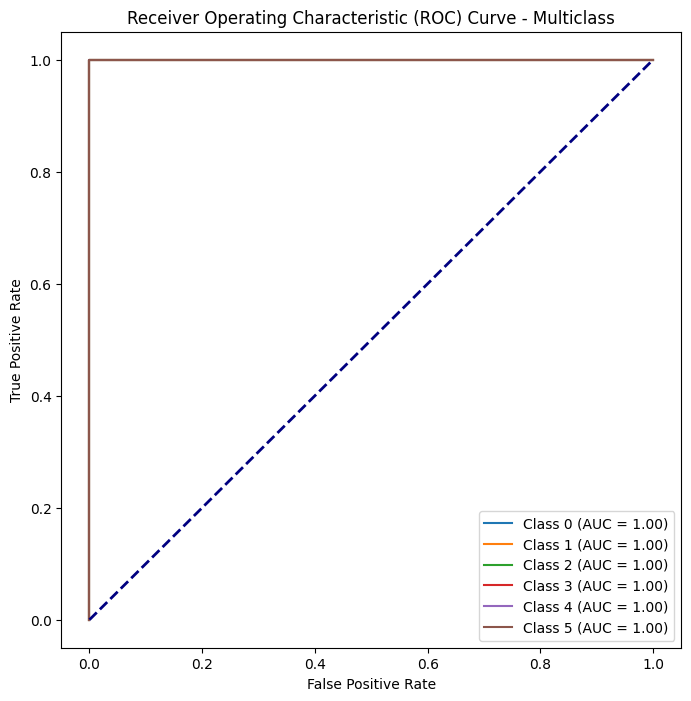

In [ ]:
from sklearn.metrics import roc_auc_score, roc_curve, auc
import matplotlib.pyplot as plt
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier

# Binarize the labels
y_test_bin = label_binarize(y_test, classes=rf_classifier.classes_)

# Fit the model
classifier = OneVsRestClassifier(rf_classifier)
y_score = classifier.fit(X_train_scaled, y_train).predict_proba(X_test_scaled)

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(len(rf_classifier.classes_)):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curve
plt.figure(figsize=(8, 8))
for i in range(len(rf_classifier.classes_)):
    plt.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve - Multiclass')
plt.legend(loc='lower right')
plt.show()



In [ ]:
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import plot_roc_curve
import matplotlib.pyplot as plt

# Generate synthetic data
X, y = make_classification(n_samples=1000, n_features=20, n_classes=3, random_state=42)

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train a Random Forest classifier
clf = RandomForestClassifier(random_state=42)
clf.fit(X_train, y_train)

# Plot the ROC curve
fig, ax = plt.subplots(figsize=(8, 8))
plot_roc_curve(clf, X_test, y_test, ax=ax)
plt.title('Multi-Class ROC Curve')
plt.show()


ImportError: cannot import name 'plot_roc_curve' from 'sklearn.metrics' (/Users/aayushjain/Library/Python/3.9/lib/python/site-packages/sklearn/metrics/__init__.py)

In [ ]:
from sklearn.model_selection import GridSearchCV

# Define hyperparameters to search
param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Create GridSearchCV object
grid_search = GridSearchCV(estimator=rf_classifier, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_train_scaled, y_train)

# Get best hyperparameters
best_params = grid_search.best_params_
print('Best Hyperparameters:', best_params)

# Retrain the model with the best hyperparameters
best_rf_classifier = RandomForestClassifier(**best_params, random_state=42)
best_rf_classifier.fit(X_train_scaled, y_train)


KeyboardInterrupt: 

In [ ]:
from sklearn.model_selection import cross_val_score, StratifiedKFold

# Define Stratified K-Fold
cv_stratified = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Evaluate model using cross-validation
cv_scores = cross_val_score(rf_classifier, X_train_scaled, y_train, cv=cv_stratified, scoring='accuracy')
print('Cross-Validation Scores:', cv_scores)
print('Mean CV Score:', np.mean(cv_scores))


Cross-Validation Scores: [1.         1.         1.         1.         0.99960412]
Mean CV Score: 0.9999208234362629


In [171]:
dataset.head()

,SUBSURVEY,SNID,IAUC,FAKE,RA,DECL,PIXSIZE,NXPIX,NYPIX,CCDNUM,...,SIM_GALFRAC_r,SIM_GALFRAC_i,SIM_GALFRAC_z,SIM_SUBSAMPLE_INDEX,RA_rad,DECL_rad,x,y,z,FLUX
0,,10473255,NULL,2,53.468451,-28.349424,0.27,-9,-9,44,...,1.384469,1.228777,1.400711,-9,0.933201,-0.494791,0.523874,0.707160,-0.474848,144.926542
1,,2110040,NULL,2,53.508185,-28.470810,0.27,-9,-9,50,...,7.968017,3.885829,3.697690,-9,0.933894,-0.496909,0.522784,0.706713,-0.476711,160.901293
2,,9966178,NULL,2,35.077432,-6.979272,0.27,-9,-9,51,...,0.558739,0.499326,0.525232,-9,0.612217,-0.121811,0.812312,0.570425,-0.121510,23.342709
3,,19732134,NULL,2,52.852204,-27.184372,0.27,-9,-9,3,...,13.111013,19.559818,34.610160,-9,0.922445,-0.474457,0.537170,0.709036,-0.456855,330235.580985
4,,1582526,NULL,2,36.932302,-5.248342,0.27,-9,-9,55,...,0.285706,0.416343,0.543132,-9,0.644590,-0.091601,0.795995,0.598352,-0.091473,124.158978


In [187]:
testdata=dataset[dataset['SIM_TYPE_NAME']=='UNKNOWN ']
column_names = [
    'SNTYPE',
    'REDSHIFT_HELIO',
    'HOSTGAL_PHOTOZ',
    'HOSTGAL_SPECZ',
    'HOSTGAL_SPECZ_ERR',
    'SIM_NON1a',
    'SIM_REDSHIFT_HELIO',
    'SIM_REDSHIFT_CMB',
    'SIM_REDSHIFT_HOST',
    'SIM_DLMU',
    'SIM_MAGSMEAR_COH',
    'MeanSquare_MAG',
    'AVG_PTROBS'
]
testdata.head()


,SUBSURVEY,SNID,IAUC,FAKE,RA,DECL,PIXSIZE,NXPIX,NYPIX,CCDNUM,...,SIM_GALFRAC_r,SIM_GALFRAC_i,SIM_GALFRAC_z,SIM_SUBSAMPLE_INDEX,RA_rad,DECL_rad,x,y,z,FLUX
1,,2110040,NULL,2,53.508185,-28.470810,0.27,-9,-9,50,...,7.968017,3.885829,3.697690e+00,-9,0.933894,-0.496909,0.522784,0.706713,-0.476711,160.901293
4,,1582526,NULL,2,36.932302,-5.248342,0.27,-9,-9,55,...,0.285706,0.416343,5.431316e-01,-9,0.644590,-0.091601,0.795995,0.598352,-0.091473,124.158978
5,,15277274,NULL,2,7.913691,-43.078257,0.27,-9,-9,35,...,0.360842,0.479993,4.385531e-13,-9,0.138120,-0.751857,0.723465,0.100565,-0.682997,2920.088773
8,,8528690,NULL,2,53.712019,-28.986642,0.27,-9,-9,26,...,1.118661,1.349952,1.882757e+00,-9,0.937452,-0.505912,0.517705,0.705080,-0.484606,3430.888348
10,,25257705,NULL,2,53.256660,-28.981820,0.27,-9,-9,25,...,0.339446,0.401912,5.550321e-01,-9,0.929504,-0.505828,0.523317,0.700976,-0.484532,16.261772


In [188]:
testdata['MeanSquare_MAG'] = testdata[['HOSTGAL_MAG_g', 'HOSTGAL_MAG_r', 'HOSTGAL_MAG_i', 'HOSTGAL_MAG_z']].mean(axis=1) ** 2
testdata['AVG_PTROBS']=testdata[['PTROBS_MIN','PTROBS_MAX']].mean(axis=1)


/var/folders/q_/dn720rf91691y39h0s_hr_280000gn/T/ipykernel_9780/1699003372.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  testdata['MeanSquare_MAG'] = testdata[['HOSTGAL_MAG_g', 'HOSTGAL_MAG_r', 'HOSTGAL_MAG_i', 'HOSTGAL_MAG_z']].mean(axis=1) ** 2
/var/folders/q_/dn720rf91691y39h0s_hr_280000gn/T/ipykernel_9780/1699003372.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  testdata['AVG_PTROBS']=testdata[['PTROBS_MIN','PTROBS_MAX']].mean(axis=1)


In [189]:
testdata_final=testdata[column_names].copy()

In [190]:
testdata_final.head()

,SNTYPE,REDSHIFT_HELIO,HOSTGAL_PHOTOZ,HOSTGAL_SPECZ,HOSTGAL_SPECZ_ERR,SIM_NON1a,SIM_REDSHIFT_HELIO,SIM_REDSHIFT_CMB,SIM_REDSHIFT_HOST,SIM_DLMU,SIM_MAGSMEAR_COH,MeanSquare_MAG,AVG_PTROBS
1,101,1.101739,1.101739,-9.000000,-9.0000,0,1.154810,1.153999,1.1270,44.492905,-0.010393,522.548705,713427.0
4,101,0.468283,0.441430,0.468283,0.0005,0,0.469220,0.468060,0.4864,42.094875,-0.019650,531.659189,230764.0
5,101,0.285946,0.233470,0.285946,0.0005,0,0.285260,0.284308,0.2860,40.825050,-0.088099,418.416383,785237.0
8,101,0.351374,0.392535,0.351374,0.0005,0,0.350735,0.350237,0.3588,41.349250,0.037528,430.851939,891374.0
10,101,0.795222,0.790470,0.795222,0.0005,0,0.795480,0.794803,0.8020,43.491486,-0.012018,597.212997,678547.5


In [191]:
testdata_final.describe()

,SNTYPE,REDSHIFT_HELIO,HOSTGAL_PHOTOZ,HOSTGAL_SPECZ,HOSTGAL_SPECZ_ERR,SIM_NON1a,SIM_REDSHIFT_HELIO,SIM_REDSHIFT_CMB,SIM_REDSHIFT_HOST,SIM_DLMU,SIM_MAGSMEAR_COH,MeanSquare_MAG,AVG_PTROBS
count,18251.0,18251.000000,18251.000000,18251.000000,18251.000000,18251.0,18251.000000,18251.000000,18251.000000,18251.000000,18251.000000,18251.000000,1.825100e+04
mean,101.0,0.682923,0.678064,-3.772472,-4.092161,0.0,0.696600,0.695560,0.694234,42.959061,-0.008233,487.054283,6.601978e+05
std,0.0,0.231211,0.235195,4.776236,4.481877,0.0,0.239347,0.239246,0.238297,1.055066,0.103771,59.137771,3.797954e+05
min,101.0,0.034409,0.067868,-9.000000,-9.000000,0.0,0.035042,0.034654,0.032300,35.915405,-0.317511,248.407978,3.600000e+01
25%,101.0,0.513840,0.485177,-9.000000,-9.000000,0.0,0.528718,0.527788,0.526000,42.407408,-0.079376,456.663287,3.333355e+05
50%,101.0,0.681381,0.681047,0.296659,0.000500,0.0,0.686301,0.685315,0.680600,43.096523,-0.008192,493.915055,6.585805e+05
75%,101.0,0.858042,0.862835,0.613302,0.000500,0.0,0.866078,0.864964,0.864000,43.718485,0.061952,521.892420,9.904648e+05
max,101.0,1.418761,1.431063,1.199963,0.000500,0.0,1.201469,1.199968,1.234000,44.598350,0.317562,3602.718243,1.316792e+06


In [194]:
testdata_final.drop('SIM_NON1a',axis=1)
print('hi')

hi


In [193]:
testdata_final.info()

<class 'pandas.core.frame.DataFrame'>
Index: 18251 entries, 1 to 39998
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   SNTYPE              18251 non-null  int64  
 1   REDSHIFT_HELIO      18251 non-null  float64
 2   HOSTGAL_PHOTOZ      18251 non-null  float64
 3   HOSTGAL_SPECZ       18251 non-null  float64
 4   HOSTGAL_SPECZ_ERR   18251 non-null  float64
 5   SIM_NON1a           18251 non-null  int64  
 6   SIM_REDSHIFT_HELIO  18251 non-null  float64
 7   SIM_REDSHIFT_CMB    18251 non-null  float64
 8   SIM_REDSHIFT_HOST   18251 non-null  float64
 9   SIM_DLMU            18251 non-null  float64
 10  SIM_MAGSMEAR_COH    18251 non-null  float64
 11  MeanSquare_MAG      18251 non-null  float64
 12  AVG_PTROBS          18251 non-null  float64
dtypes: float64(11), int64(2)
memory usage: 1.9 MB


In [195]:
rows_to_remove = testdata_final[
    (testdata_final['HOSTGAL_PHOTOZ'].round(5) == -9) | 
    (testdata_final['HOSTGAL_SPECZ'].round(5) == -9)
].index

# Drop rows with -9 in 'HOSTGAL_PHOTOZ' or 'HOSTGAL_SPECZ'
testdata_final.drop(rows_to_remove, inplace=True)

In [196]:
testdata_final.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9952 entries, 4 to 39998
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   SNTYPE              9952 non-null   int64  
 1   REDSHIFT_HELIO      9952 non-null   float64
 2   HOSTGAL_PHOTOZ      9952 non-null   float64
 3   HOSTGAL_SPECZ       9952 non-null   float64
 4   HOSTGAL_SPECZ_ERR   9952 non-null   float64
 5   SIM_NON1a           9952 non-null   int64  
 6   SIM_REDSHIFT_HELIO  9952 non-null   float64
 7   SIM_REDSHIFT_CMB    9952 non-null   float64
 8   SIM_REDSHIFT_HOST   9952 non-null   float64
 9   SIM_DLMU            9952 non-null   float64
 10  SIM_MAGSMEAR_COH    9952 non-null   float64
 11  MeanSquare_MAG      9952 non-null   float64
 12  AVG_PTROBS          9952 non-null   float64
dtypes: float64(11), int64(2)
memory usage: 1.1 MB


In [198]:
testdata_final.drop('SIM_NON1a',axis=1)
print("Boo")

Boo


In [199]:
testdata_final.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9952 entries, 4 to 39998
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   SNTYPE              9952 non-null   int64  
 1   REDSHIFT_HELIO      9952 non-null   float64
 2   HOSTGAL_PHOTOZ      9952 non-null   float64
 3   HOSTGAL_SPECZ       9952 non-null   float64
 4   HOSTGAL_SPECZ_ERR   9952 non-null   float64
 5   SIM_NON1a           9952 non-null   int64  
 6   SIM_REDSHIFT_HELIO  9952 non-null   float64
 7   SIM_REDSHIFT_CMB    9952 non-null   float64
 8   SIM_REDSHIFT_HOST   9952 non-null   float64
 9   SIM_DLMU            9952 non-null   float64
 10  SIM_MAGSMEAR_COH    9952 non-null   float64
 11  MeanSquare_MAG      9952 non-null   float64
 12  AVG_PTROBS          9952 non-null   float64
dtypes: float64(11), int64(2)
memory usage: 1.1 MB


In [202]:
testdata_final.describe()

,SNTYPE,REDSHIFT_HELIO,HOSTGAL_PHOTOZ,HOSTGAL_SPECZ,HOSTGAL_SPECZ_ERR,SIM_NON1a,SIM_REDSHIFT_HELIO,SIM_REDSHIFT_CMB,SIM_REDSHIFT_HOST,SIM_DLMU,SIM_MAGSMEAR_COH,MeanSquare_MAG,AVG_PTROBS
count,9952.0,9952.000000,9952.000000,9952.000000,9.952000e+03,9952.0,9952.000000,9952.000000,9952.000000,9952.000000,9952.000000,9952.000000,9.952000e+03
mean,101.0,0.586779,0.577866,0.586779,5.000000e-04,0.0,0.586783,0.585787,0.585210,42.499929,-0.006695,472.994454,6.565281e+05
std,0.0,0.205746,0.209737,0.205746,2.168513e-19,0.0,0.205740,0.205642,0.204701,1.070196,0.103015,65.850272,3.813691e+05
min,101.0,0.034409,0.067868,0.034409,5.000000e-04,0.0,0.035042,0.034654,0.032300,35.915405,-0.317511,248.407978,3.600000e+01
25%,101.0,0.436364,0.410972,0.436364,5.000000e-04,0.0,0.436601,0.435571,0.433600,41.908420,-0.077110,437.595548,3.266165e+05
50%,101.0,0.591604,0.579569,0.591604,5.000000e-04,0.0,0.591655,0.590708,0.594450,42.703567,-0.007362,480.091521,6.527690e+05
75%,101.0,0.725257,0.723191,0.725257,5.000000e-04,0.0,0.724902,0.723732,0.728000,43.241969,0.062725,509.967810,9.873072e+05
max,101.0,1.199963,1.431063,1.199963,5.000000e-04,0.0,1.200448,1.199599,1.221000,44.597233,0.314133,3602.718243,1.316728e+06


In [203]:
scaler = StandardScaler()
testdata_final.drop(['SIM_NON1a','SNTYPE'],axis=1,inplace=True)
X_train_scaled = scaler.fit_transform(testdata_final)
X_test_scaled = scaler.transform(testdata_final)
y_cal = rf_classifier.predict(X_test_scaled)


In [206]:
print(y_cal)

[120 122 123 ... 120 120 120]
